In [1]:
#### import torch
import pandas as pd
import os
import random
import matplotlib.pyplot as plt
from autoreject import get_rejection_threshold
from Utills_Fooof import cal_foof
from Utills_Fooof import pre_process_meg
import mne
import pandas as pd
import numpy as np
import scipy as sci
from scipy.interpolate import interp1d
from mne.preprocessing import ICA
import mne
import json
import os
import pickle
random.seed(313)
plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300
parkinson = dict()
healthy = dict()
saving_path = '/space/slow/hno/OMEGA_dataset/processed'


In [ ]:
def find_session_folders(root_dir):
    """Find all subfolders named like 'ses*' recursively within root_dir."""
    session_paths = []
    for dirpath, dirnames, _ in os.walk(root_dir):
        for dirname in dirnames:
            if dirname.lower().startswith('ses'):
                session_paths.append(os.path.join(dirpath, dirname))
    return session_paths


def load_data(subject, index=None):
    """Load MEG resting-state and noise data for a subject from the OMEGA dataset."""
    base_path = '/space/slow/hno/OMEGA_dataset/extracted_files'
    subject_path = os.path.join(base_path, subject)
    sessions = find_session_folders(subject_path)

    resting_runs = []
    raw_noise = None

    for ses_path in sessions:
        meg_dir = os.path.join(ses_path, 'meg')
        if not os.path.isdir(meg_dir):
            continue

        runs = next(os.walk(meg_dir))[1]
        for run in runs:
            run_parts = run.split('_')
            if len(run_parts) < 3:
                continue
            run_type = run_parts[2]
            run_path = os.path.join(meg_dir, run)

            if run_type == 'task-rest':
                raw = mne.io.read_raw_ctf(run_path, preload=True, verbose=False)
                resting_runs.append(raw)
            elif run_type == 'task-noise':
                raw_noise = mne.io.read_raw_ctf(run_path, preload=True, verbose=False)

    if not resting_runs:
        raise RuntimeError(f"No resting-state runs found for subject {subject}.")

    if len(resting_runs) > 1:
        # Align coordinate frames before concatenating
        ref_trans = resting_runs[0].info['dev_head_t']
        for run in resting_runs:
            run.info['dev_head_t'] = ref_trans

        try:
            data = mne.concatenate_raws(resting_runs)
            print(f'{len(resting_runs)} resting-state runs loaded and concatenated.')
        except Exception as e:
            print(f'Mismatch in channel count, loading only one run. Error: {e}')
            data = resting_runs[0]
    else:
        data = resting_runs[0]
        print('Only one resting-state run found and loaded.')

    return data, raw_noise


In [ ]:
# Define paths
saving_path = '/space/slow/hno/OMEGA_dataset/new_processed'
directory_path = '/space/slow/hno/OMEGA_dataset/extracted_files'
old_path = os.path.join(directory_path, 'OMEGA_participants_old_version.tsv')
updated_path = os.path.join(directory_path, 'OMEGA_participants_updated.tsv')

# Load and combine participant info
old = pd.read_csv(old_path, sep='\t')
updated = pd.read_csv(updated_path, sep='\t')
participants = pd.concat([old, updated], ignore_index=True).drop_duplicates()

# Save combined participant info for reference
participants.to_csv(os.path.join(saving_path, 'participants.csv'), index=False)

# Extract subject IDs and group info
subject_ids = participants['participant_id'].tolist()
groups = participants['group'].tolist()

# List all subject directories (excluding system files/folders)
all_subjects = [f.name for f in os.scandir(directory_path) if f.is_dir() and f.name != '.ipynb_checkpoints']

# Track already processed .fif files
processed_files = [f.name for f in os.scandir(saving_path) if f.is_file() and f.name.endswith('.fif')]
processed_subjects = ['sub-' + name.split('-')[-1].split('_epo')[0] for name in processed_files]


parkinson = {}
healthy = {}
for sid, grp in zip(subject_ids, groups):
    if sid in processed_subjects:
        if grp == 'parkinson':
            parkinson[sid] = grp
        elif grp == 'healthy':
            healthy[sid] = grp

In [ ]:
# Initialize quality tracking structure
subject_qualit = {
    'control': {'subject': []},
    'parkinson': {'subject': []},
    'bad_subj': {'subject': []}
}

# Loop through all unprocessed subjects
for index, sub in enumerate(subjects):
    if sub in processed_subj:
        continue

    print(f'{sub} loaded ...')
    condition_row = partisipants[partisipants['participant_id'] == sub]

    # Skip chronic pain subjects
    if len(condition_row) == 1 and condition_row.iloc[0]['group'] == 'Chronic Pain':
        continue

    try:
        data, noise = load_data(sub, index)
        clean_sig, rej_ics = pre_process_meg(data, noise)

        # Epoch and reject artifacts
        epochs = mne.make_fixed_length_epochs(clean_sig, duration=1, overlap=0, preload=True, verbose=False)
        reject_criteria = get_rejection_threshold(epochs)
        epochs.drop_bad(reject=reject_criteria, verbose=False)

        group_label = condition_row.iloc[0]['group']
        filename = f'{group_label}_{sub}_epo.fif'
        filepath = os.path.join(saving_path, filename)

        if group_label == 'Control':
            epochs.save(filepath, overwrite=True)
            subject_qualit['control']['subject'].append({'subject': sub, 'ic_rej': rej_ics})
        elif group_label == 'Parkinson':
            epochs.save(filepath, overwrite=True)
            subject_qualit['parkinson']['subject'].append({'subject': sub, 'ic_rej': rej_ics})

        print(f'Subject {sub} saved')

    except Exception as e:
        error_msg = str(e)
        subject_qualit['bad_subj']['subject'].append({'subject': sub, 'error': error_msg})
        print(f'{sub} failed to process: {error_msg}')

    # Always update quality tracking file regardless of success
    with open('subject_qualit.json', 'w') as file:
        json.dump(subject_qualit, file, indent=4)

    print('==================================================')


Enter MEG sesnor type: 
==> gradiometer
==> magnetoneter
==> both
 magnetometer


Range [1, 80] Started ....
 Parkinsonian Files are being loaded ....
===================== [1, 80] Done :-D ====================
Range [3, 60] Started ....
 Parkinsonian Files are being loaded ....


/tmp/ipykernel_1373372/2741443480.py:87: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


===================== [3, 60] Done :-D ====================
Range [3, 80] Started ....
 Parkinsonian Files are being loaded ....
===================== [3, 80] Done :-D ====================
All ranges fooofed


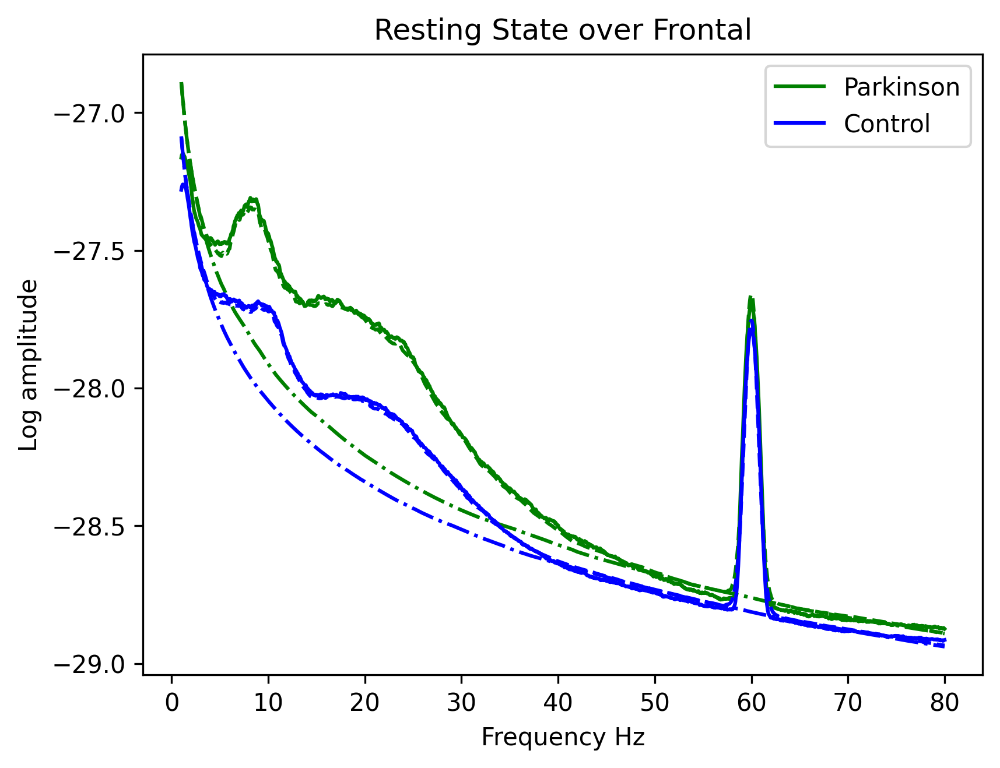

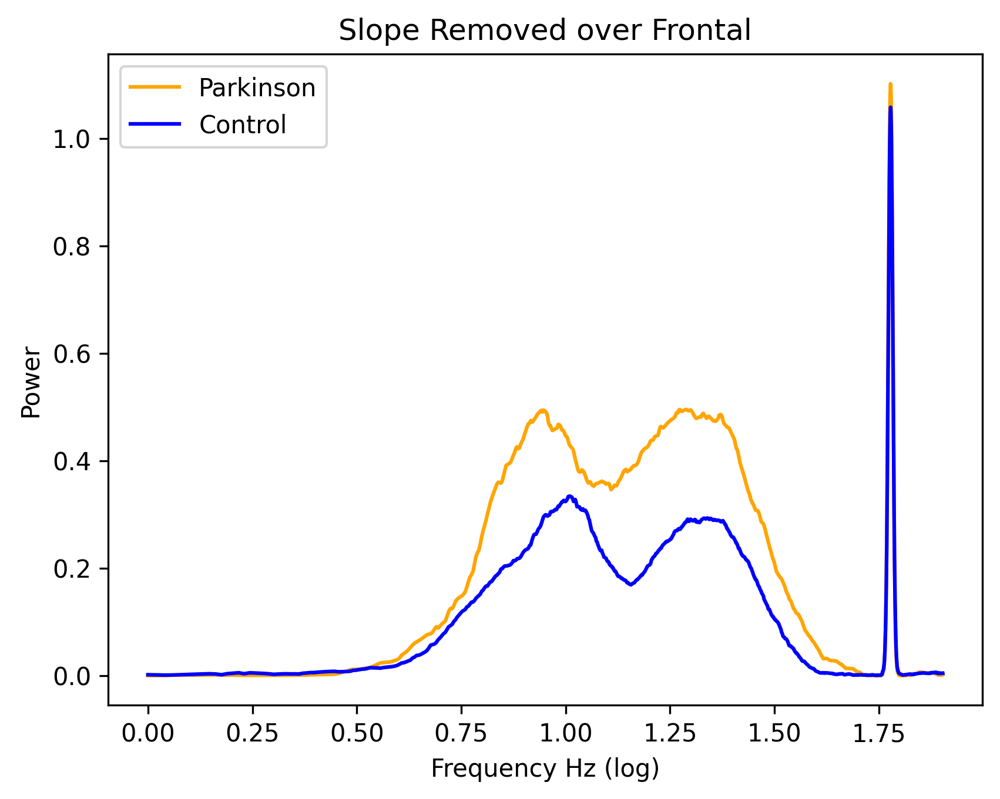

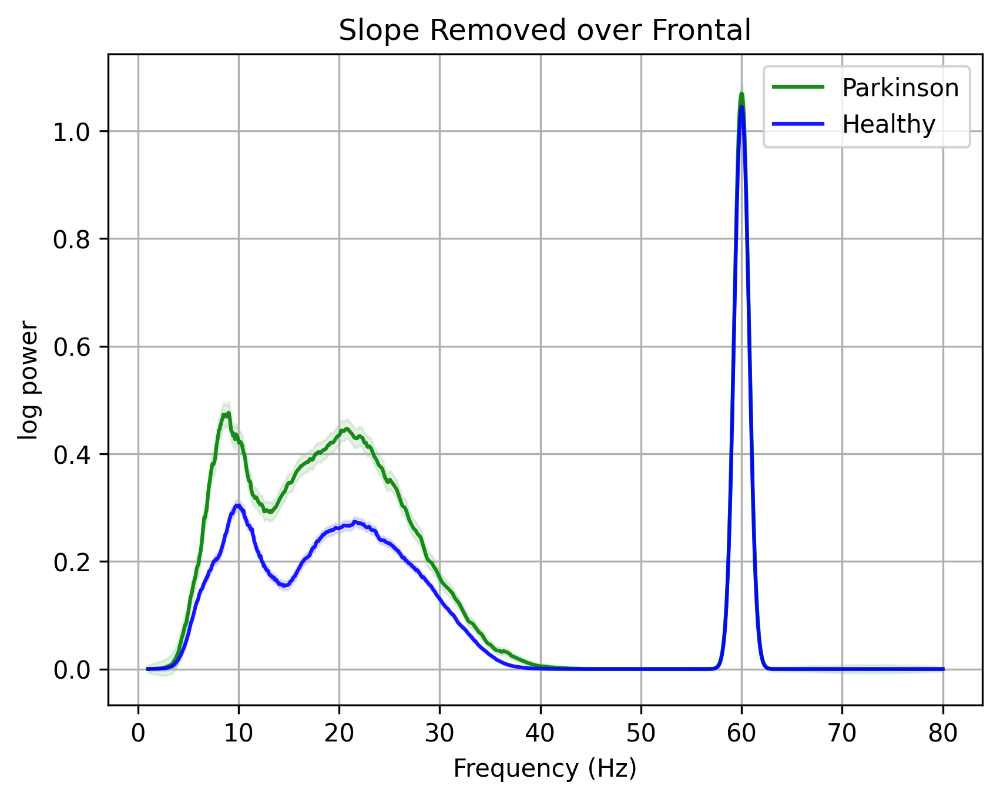

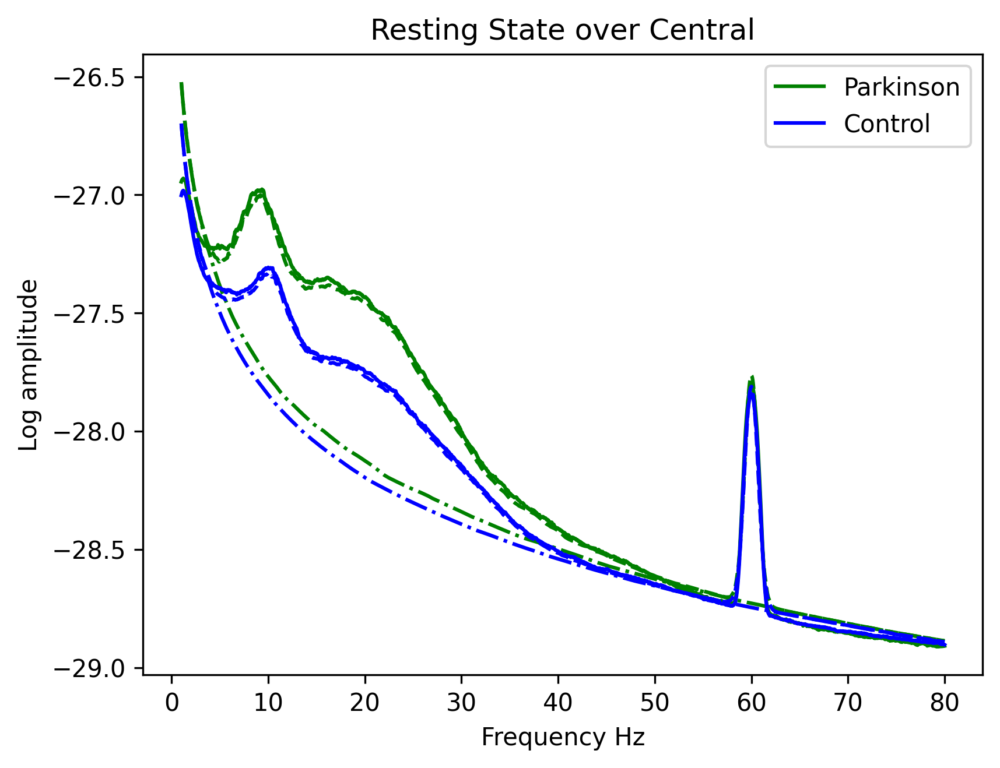

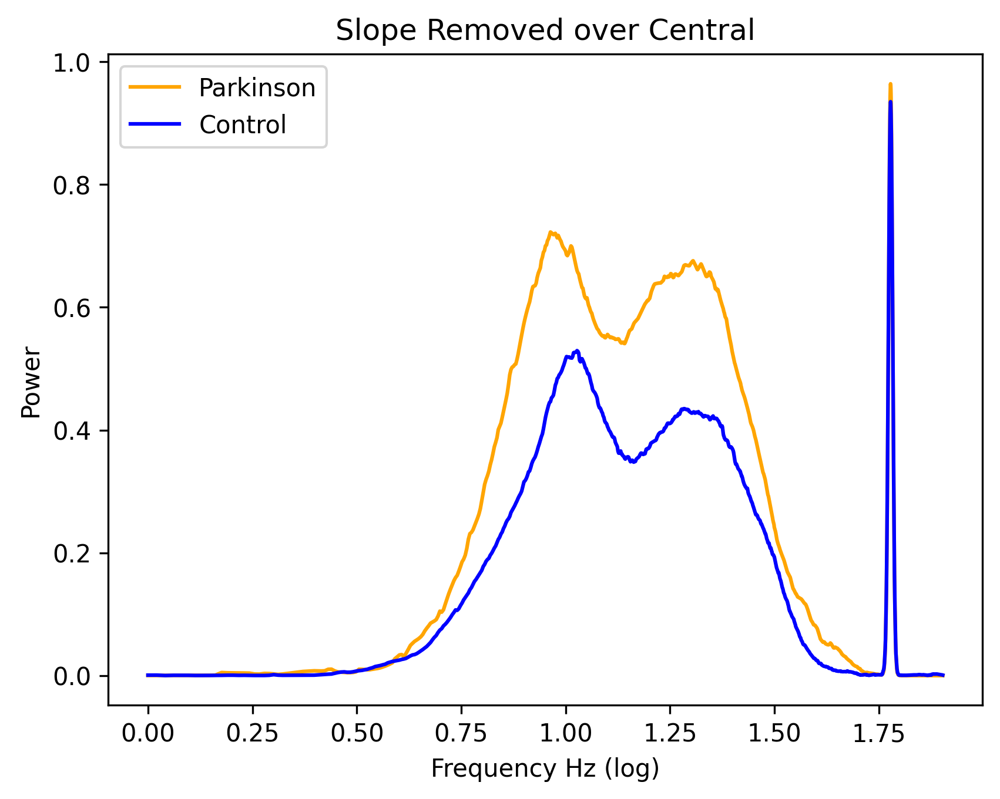

...

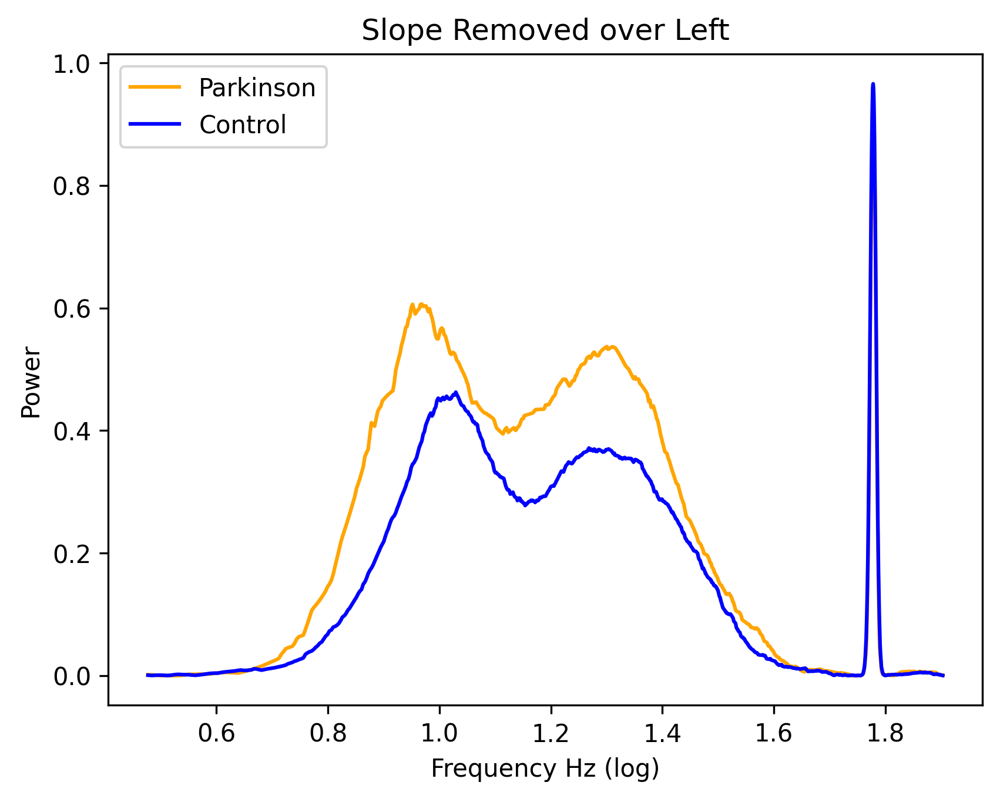

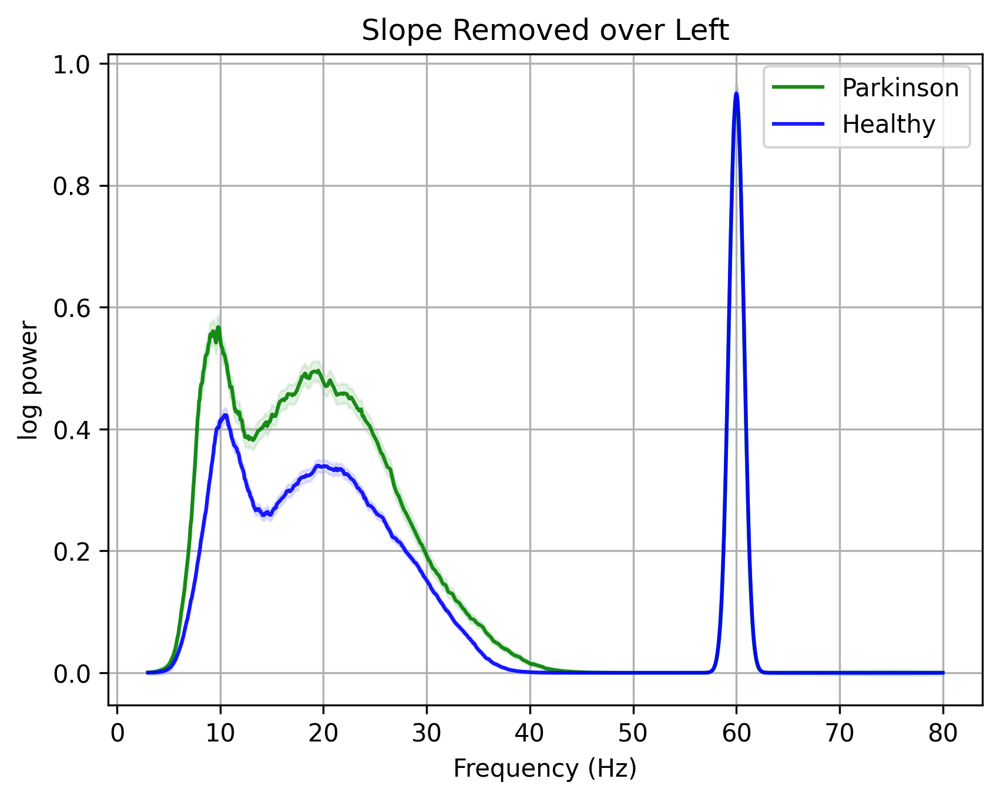

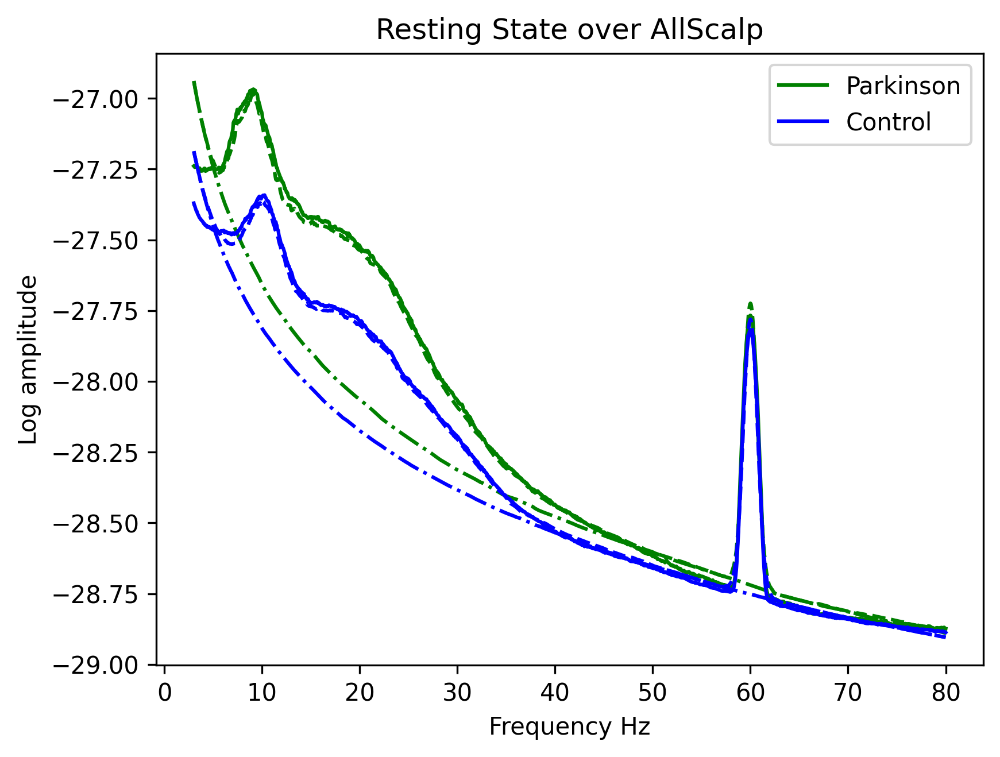

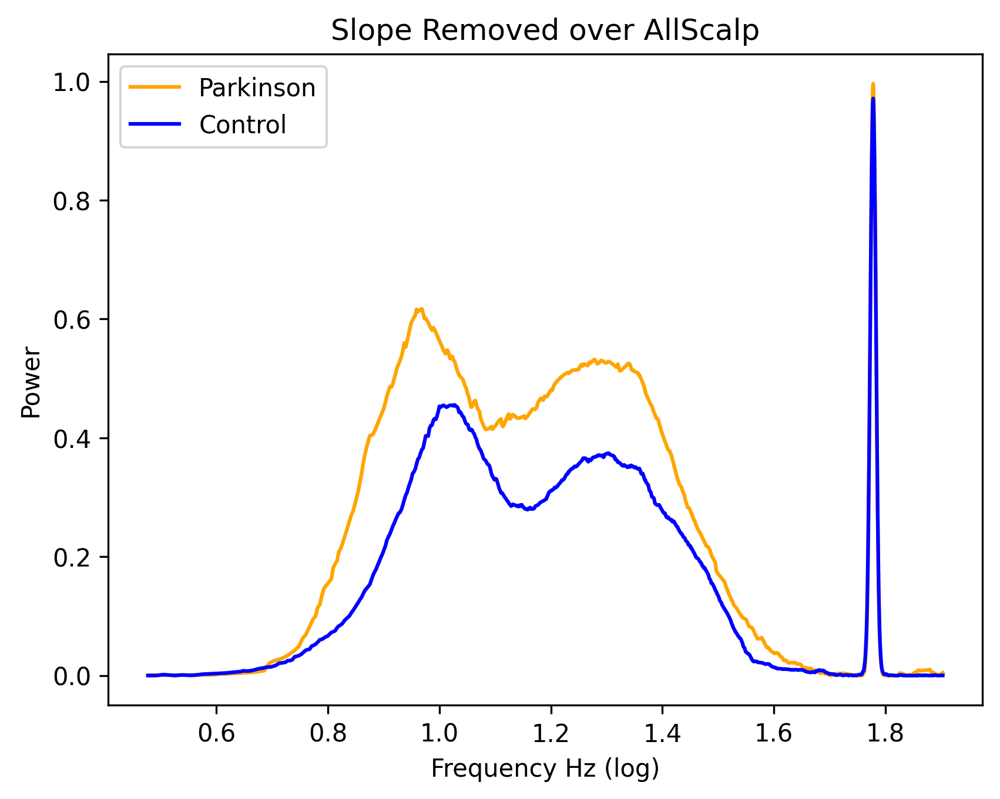

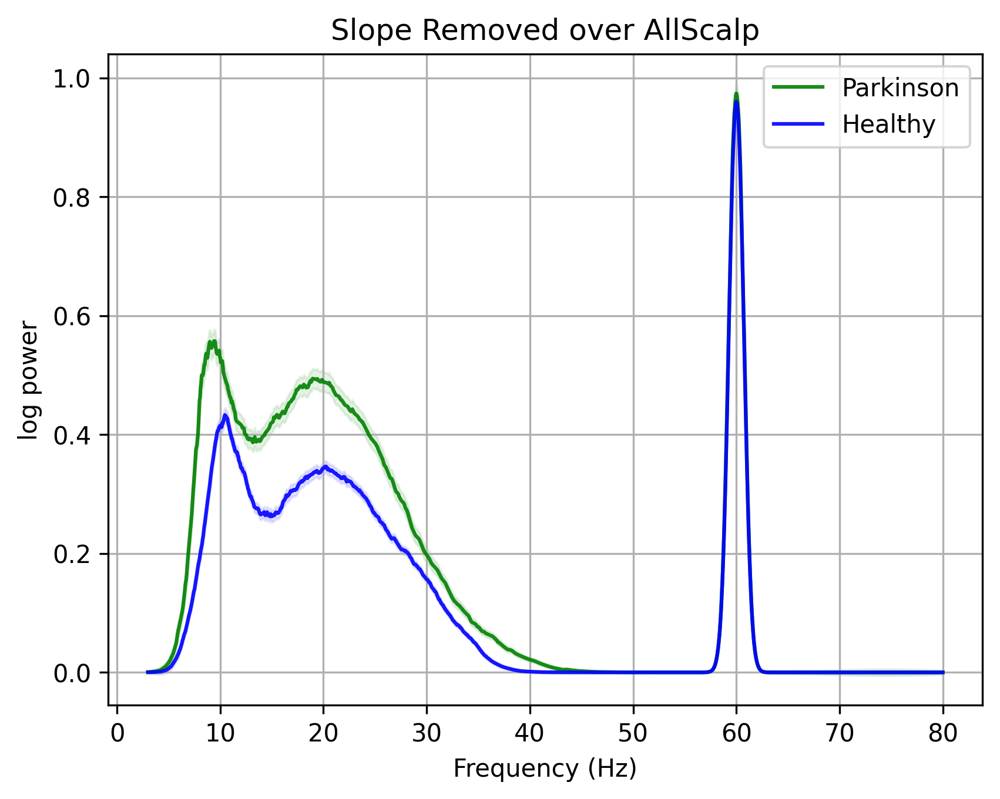

In [7]:
control_files = [f.name for f in os.scandir(saving_path) if f.is_file() and 'Control' in f.name and f.name.endswith('.fif')]
parkinson_files  = [f.name for f in os.scandir(saving_path) if f.is_file() and 'Parkinson' in f.name and f.name.endswith('.fif')]
data_sensor = input('Enter MEG sesnor type: \n==> gradiometer\n==> magnetoneter\n==> both\n')

freqs = [[1, 20], [1, 30], [1, 40], [1, 50], [1, 60], [1, 70], [1, 80], [1, 90], [3, 20], [3, 30], [3, 40], [3, 50], [3, 60], [3, 70], [3, 80], [3, 90]]

for freq in range(len(freqs)):
    fmin = freqs[freq][0]
    fmax = freqs[freq][1]
    f_range = [fmin, fmax]
    save_fooof = f'/space/slow/hno/OMEGA_dataset/fooofed_with_magnetometer/Range_{fmin}-{fmax}_Hz'
    os.makedirs(save_fooof, exist_ok=True)
    print(f'Range {f_range} Started ....')
    
    # FOOOFING Controls
    for index, sub in enumerate(control_files):
        epochs = mne.read_epochs(os.path.join(saving_path, control_files[index]), proj=True, preload=True, verbose=False)
        name = sub.split('_epo')[0].split('_')[-1]
        Control[f'{name}'] = cal_foof(epochs, f_range=f_range, low_freq_to_del=False, high_freq_to_del=False, remove_line_noise=False, data_sensor=data_sensor)
        with open(save_fooof + '/Controls.pkl', 'wb') as f:
            pickle.dump(Control, f)
            
    print(' Parkinsonian Files are being loaded ....') 
    # FOOOFING Parkinsons
    for index, sub in enumerate(parkinson_files): 
        epochs = mne.read_epochs(os.path.join(saving_path, parkinson_files[index]), preload=True, proj=True, verbose=False)
        name = sub.split('_epo')[0].split('_')[-1]
        parkinson[f'{name}'] = cal_foof(epochs, f_range=f_range, low_freq_to_del=False, high_freq_to_del=False, remove_line_noise=False, data_sensor=data_sensor)
        with open(save_fooof + '/Parkinson.pkl', 'wb') as f:
            pickle.dump(parkinson, f)


    ## Analysing 
    acc_parkinson = []
    for index, name in enumerate(parkinson):
        acc = 1 - parkinson[f'{name}']['AllScalp'].error_
        acc_parkinson.append(acc)
        
    acc_control = []
    for index, name in enumerate(Control):
        acc = 1 - Control[f'{name}']['AllScalp'].error_
        acc_control.append(acc)
    
    z_score_PD = [abs((x - np.mean(acc_parkinson)) / np.std(acc_parkinson)) for x in acc_parkinson]
    z_score_CT = [abs((x - np.mean(acc_control)) /  np.std(acc_control)) for x in acc_control]
    
    x_values_list1 = range(len(acc_control))
    x_values_list2 = range(len(acc_parkinson))
    
    # fig, ax1 = plt.subplots(1, 1)
    # plt.subplots_adjust(left=0.15, bottom=0.14, right=None, top=None, wspace=None, hspace=None)
    # fig1, = ax1.plot(x_values_list1, z_score_CT, '*', color='red', label=f"Controls, M = {np.round(np.mean(acc_control), 4)}, SD = {np.round(np.std(acc_control), 4)}")
    # fig2, = ax1.plot(x_values_list2, z_score_PD, 'x', color='blue', label=f"Parkinson, M = {np.round(np.mean(acc_parkinson), 4)}, SD = {np.round(np.std(acc_parkinson), 4)}")
    # plt.legend()
    # # Label the axes
    # plt.ylabel("ACC Z-Score")
    # plt.xlabel("Participants")
    # plt.title("Fooofing Accuracy")
    # plt.show()
    
    
    # Extracting Bad data indices
    bad_index_PD = [x for x, s in enumerate(z_score_PD) if s>2]
    bad_index_CT = [x for x, s in enumerate(z_score_CT) if s>2]
    
    new_zscore_PD = [z for x, z in enumerate(z_score_PD) if x not in bad_index_PD]
    new_zscore_CT = [z for x, z in enumerate(z_score_CT) if x not in bad_index_CT]
    
    new_values_list1 = range(len(new_zscore_PD))
    new_values_list2 = range(len(new_zscore_CT))
    
    # fig, ax2 = plt.subplots(1, 1)
    # plt.subplots_adjust(left=0.15, bottom=0.14, right=None, top=None, wspace=None, hspace=None)
    # fig1, = ax2.plot(new_values_list1, new_zscore_PD, 'x', color='blue', label=f"Parkinson, M = {np.round(np.mean(acc_control), 4)}, SD = {np.round(np.std(acc_control), 4)}")
    # fig2, = ax2.plot(new_values_list2, new_zscore_CT, '*', color='red', label=f"Controls, M = {np.round(np.mean(acc_parkinson), 4)}, SD = {np.round(np.std(acc_parkinson), 4)}")
    # plt.legend()
    # # Label the axes
    # plt.ylabel("ACC Z-Score")
    # plt.xlabel("Participants")
    # plt.title("Fooofing Accuracy")
    # plt.show()
    
    # Remove bad PD files
    keys = list(parkinson.keys())
    pd_keys_to_remove = [keys[i] for i in bad_index_PD]
    for key in pd_keys_to_remove:
        parkinson.pop(key, None)
    
    
    # Remove bad CT files
    keys = list(Control.keys())
    ct_keys_to_remove = [keys[i] for i in bad_index_CT]
    for key in ct_keys_to_remove:
        Control.pop(key, None)
    
    rejected_subjects = {'PD': {'number of rejected subjects': len(pd_keys_to_remove), 'Names': [pd_keys_to_remove]}
                        ,'CT': {'number of rejected subjects': len(ct_keys_to_remove), 'Names': [ct_keys_to_remove]}}
    
    # Save the dictionary of outliers to a JSON file
    with open(save_fooof + f'/rejected_subjects_for_{fmin}-{fmax}.json', 'w') as json_file:
        json.dump(rejected_subjects, json_file, indent=4)

    condition = ['Resting State', 'Parkinson', 'Control']
    results = signal_plot(parkinson, Control, save_fooof, condition=condition)
    peak_index = get_areas(results, f_range, save_root=save_fooof, srate=500)  
    # Create the dictionary structure for producing a dataframe
    regions = ['Frontal', 'Central', 'Occipital', 'Left', 'Right', 'AllScalp']
    features = ['acc', 'exp', 'offs', 'alpha-CF', 'alpha-peak', 'Lowbeta-CF', 'Lowbeta-peak']#, 'Highbeta-CF', 'Highbeta-peak']
    brain_features = {'PD': {region: {feature: [] for feature in features} for region in regions}, 'CT': {region: {feature: [] for feature in features} for region in regions}}
    
    for region in regions:
        for index, name in enumerate(parkinson):
            brain_features['PD'][region]['exp'].append(np.round(parkinson[f'{name}'][region].get_params('aperiodic_params')[1], 4))
            brain_features['PD'][region]['offs'].append(np.round(parkinson[f'{name}'][region].get_params('aperiodic_params')[0],4))
            brain_features['PD'][region]['acc'].append(np.round(1-parkinson[f'{name}'][region].error_, 4))
        brain_features['PD'][region]['alpha-CF'] = list(peak_index['parkinson'][region]['alpha']['CF'])
        brain_features['PD'][region]['alpha-peak'] = list(peak_index['parkinson'][region]['alpha']['peak'])
        brain_features['PD'][region]['Lowbeta-CF'] = list(peak_index['parkinson'][region]['Lowbeta']['CF'])
        brain_features['PD'][region]['Lowbeta-peak'] = list(peak_index['parkinson'][region]['Lowbeta']['peak'])
        # brain_features['PD'][region]['Highbeta-CF'] = list(peak_index['parkinson'][region]['Highbeta']['CF'])
        # brain_features['PD'][region]['Highbeta-peak'] = list(peak_index['parkinson'][region]['Highbeta']['peak'])
    
        for index, name in enumerate(Control):
            brain_features['CT'][region]['exp'].append(np.round(Control[f'{name}'][region].get_params('aperiodic_params')[1], 4))
            brain_features['CT'][region]['offs'].append(np.round(Control[f'{name}'][region].get_params('aperiodic_params')[0], 4))
            brain_features['CT'][region]['acc'].append(np.round(1-Control[f'{name}'][region].error_,4))
        brain_features['CT'][region]['alpha-CF'] = list(peak_index['healthy'][region]['alpha']['CF'])
        brain_features['CT'][region]['alpha-peak'] = list(peak_index['healthy'][region]['alpha']['peak'])
        brain_features['CT'][region]['Lowbeta-CF'] = list(peak_index['healthy'][region]['Lowbeta']['CF'])
        brain_features['CT'][region]['Lowbeta-peak'] = list(peak_index['healthy'][region]['Lowbeta']['peak'])
        # brain_features['CT'][region]['Highbeta-CF'] = list(peak_index['healthy'][region]['Highbeta']['CF'])
        # brain_features['CT'][region]['Highbeta-peak'] = list(peak_index['healthy'][region]['Highbeta']['peak'])

    rows = []

    # Iterate through the data structure to populate the rows
    for group, regions in brain_features.items():
        for region, features in brain_features[group].items():
            # Find the minimum length of the lists to handle different lengths safely
            if group == 'PD':
                Length = len(parkinson)
            else:
                Length = len(Control)
    
            for i in range(Length):
                row = {
                    'Group': group,
                    'Region': region,
                    'acc': features['acc'][i],
                    'exp': features['exp'][i],
                    'offs': features['offs'][i],
                    'alpha-CF': features['alpha-CF'][i],
                    'alpha-peak': features['alpha-peak'][i],
                    'Lowbeta-CF': features['Lowbeta-CF'][i],
                    'Lowbeta-peak': features['Lowbeta-peak'][i]#,
                    # 'Highbeta-CF': features['Highbeta-CF'][i],
                    # 'Highbeta-peak': features['Highbeta-peak'][i]
                }
                rows.append(row)
    
    # Create a DataFrame from the rows
    df = pd.DataFrame(rows, columns=['Group', 'Region','acc', 'exp', 'offs', 'alpha-CF', 'alpha-peak', 'Lowbeta-CF', 'Lowbeta-peak'])#, 'Highbeta-CF', 'Highbeta-peak'])
    df.to_csv(save_fooof + f'/data_for_{fmin}-{fmax}.csv', index=False)
    
    print(f'===================== {f_range} Done :-D ====================')

print('All ranges fooofed')
